In [1]:
import pandas as pd
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose
from matplotlib import pyplot
import matplotlib.pyplot as plt 
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.stattools import adfuller
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_predict
import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()
from fbprophet import Prophet
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from catboost import CatBoostRegressor

In [2]:
# MAPE calculation
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

The dataset consists of data for different stores (*store_nbr*). For each store, the dates indicate the product and its quantity (*'unit_sales'*).

In [3]:
dataset = pd.read_csv('train.csv') 
dataset.head()

/Users/anna.zemit/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning:

Columns (5) have mixed types.Specify dtype option on import or set low_memory=False.



,id,date,store_nbr,item_nbr,unit_sales,onpromotion
0,0,2013-01-01,25,103665,7.0,NaN
1,1,2013-01-01,25,105574,1.0,NaN
2,2,2013-01-01,25,105575,2.0,NaN
3,3,2013-01-01,25,108079,1.0,NaN
4,4,2013-01-01,25,108701,1.0,NaN


Group the data by date and sum the number of sales for store number 25

In [4]:
train_data = dataset[dataset.store_nbr==25].groupby("date")['unit_sales'].sum().reset_index()

### Make a seasonal decomposition.

In [5]:
# bring indexes to pd.Datetime standard
train_data = train_data.set_index(pd.DatetimeIndex(train_data['date'])) 
train_data.head() 

,date,unit_sales
date,,
2013-01-01,2013-01-01,2511.619
2013-01-02,2013-01-02,5316.224
2013-01-03,2013-01-03,4442.913
2013-01-04,2013-01-04,4844.354
2013-01-05,2013-01-05,5817.526


In [6]:
# since we now have a date index, we no longer need a date column that duplicates it
train_data.drop(['date'], axis = 1, inplace = True)
train_data.head() 

,unit_sales
date,
2013-01-01,2511.619
2013-01-02,5316.224
2013-01-03,4442.913
2013-01-04,4844.354
2013-01-05,5817.526


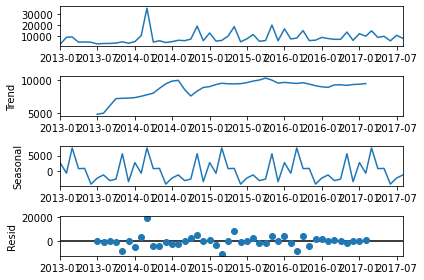

In [7]:
# do seasonal_decompose
# this function decomposes the series into trend, seasonal and noise components
decomposition = seasonal_decompose(train_data.asfreq('MS').fillna(train_data['unit_sales'].mean()), model='additive')
decomposition.plot()
pyplot.show() 

### Do the Dickey-Fuller test

In [13]:
from statsmodels.tsa.stattools import adfuller

test = adfuller(train_data['unit_sales'])
print ('adf: ', test[0] )
print ('p-value: ', test[1])
print ('Critical values: ', test[4])
if test[0]> test[4]['5%']:  
    print ('is not stationary')
else:
    print ('is stationary')

adf:  -4.858992665318178
p-value:  4.188394192907814e-05
Critical values:  {'1%': -3.4344642432857992, '5%': -2.8633571955690647, '10%': -2.5677374399794197}
ряд стационарен


The time series is stationary

### Split the time series into three sets

In [14]:
from sklearn.model_selection import TimeSeriesSplit

tscv = TimeSeriesSplit(n_splits=3,test_size=7)

Derive the sizes of the obtained subsamples

In [15]:
train_test_groups = tscv.split(train_data['unit_sales']) 
for train_index, test_index in train_test_groups:
    print("TRAIN size:", len(train_index), "TEST size:", len(test_index))

TRAIN size: 1597 TEST size: 7
TRAIN size: 1604 TEST size: 7
TRAIN size: 1611 TEST size: 7


# Train time series prediction models

In [32]:
train = dataset.copy()
top1 = train[train.item_nbr == 103501 ]
top1['date'] = pd.to_datetime(top1['date'])
top1['year'] = top1['date'].dt.year

<ipython-input-32-29093ada7ec0>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-32-29093ada7ec0>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [33]:
# preprocess the data
unit_sales_by_date = top1.groupby('date').sum()['unit_sales']

### Adfuller test to test stationary time series

In [34]:
X = unit_sales_by_date.values
result = adfuller(X)
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

if result[0] < result[4]["5%"]:
    print ("Reject Ho - Time Series is Stationary")
else:
    print ("Failed to Reject Ho - Time Series is Non-Stationary")

ADF Statistic: -4.154403
p-value: 0.000786
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568
Reject Ho - Time Series is Stationary


### Moving average model

Implement a moving average model. Try to take 6 days window. Then we compare the result with the last 6 days that were not used in the calculation of the moving average

(6,) (6,)
mean_squared_error 287.087962962963
mean_absolute_error 13.416666666666666
mean_absolute_percentage_error 17.213844967435175


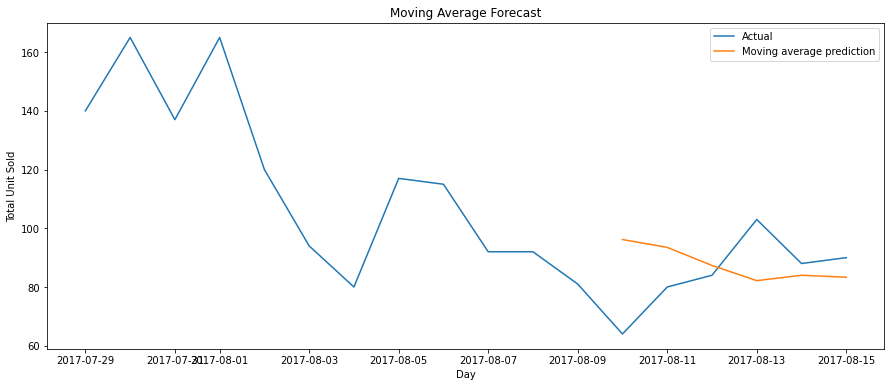

In [35]:
def moving_average_forecast(series, window_size):
    forecast = []
    for time in range(len(series) - window_size):
        forecast.append(series[time:time + window_size].mean())
    return np.array(forecast)
moving_average_days = 6

shown_train_size = moving_average_days * 3
moving_avg = moving_average_forecast(unit_sales_by_date,moving_average_days )
moving_avg = pd.Series(moving_avg, index = unit_sales_by_date[moving_average_days:].index)

print(moving_avg[-moving_average_days:].shape,unit_sales_by_date[-moving_average_days:].shape)

print("mean_squared_error",mean_squared_error(unit_sales_by_date.values[-moving_average_days:], moving_avg[-moving_average_days:]))
print("mean_absolute_error",mean_absolute_error(unit_sales_by_date.values[-moving_average_days:], moving_avg[-moving_average_days:]))
print("mean_absolute_percentage_error", mean_absolute_percentage_error(unit_sales_by_date.values[-moving_average_days:], moving_avg[-moving_average_days:]))


plt.figure(figsize=(15,6))

plt.plot(unit_sales_by_date[- shown_train_size:], label="Actual")
plt.plot(moving_avg[-moving_average_days:], label="Moving average prediction")
plt.ylabel("Total Unit Sold")
plt.xlabel("Day")
plt.title("Moving Average Forecast")
plt.legend(loc="upper right")

In [36]:
# make lags from 1 to 6

df = pd.DataFrame()

df["Original Values"]  = unit_sales_by_date
df["shift1"] = df["Original Values"].shift(6)
df["shift2"] = df["shift1"].shift()
df["shift3"] = df["shift2"].shift()
df["shift4"] = df["shift3"].shift()
df["shift5"] = df["shift4"].shift()
df["shift6"] = df["shift5"].shift()
df.dropna(inplace=True)

In [37]:
df # result

,Original Values,shift1,shift2,shift3,shift4,shift5,shift6
date,,,,,,,
2013-01-13,128.0,98.0,173.0,160.0,155.0,153.0,185.0
2013-01-14,97.0,103.0,98.0,173.0,160.0,155.0,153.0
2013-01-15,127.0,71.0,103.0,98.0,173.0,160.0,155.0
2013-01-16,102.0,83.0,71.0,103.0,98.0,173.0,160.0
2013-01-17,66.0,91.0,83.0,71.0,103.0,98.0,173.0
...,...,...,...,...,...,...,...
2017-08-11,80.0,117.0,80.0,94.0,120.0,165.0,137.0
2017-08-12,84.0,115.0,117.0,80.0,94.0,120.0,165.0
2017-08-13,103.0,92.0,115.0,117.0,80.0,94.0,120.0


In [38]:
# postpone the last 2 days in the test sample to make a prediction
predict_size = 2
x_train, y_train = df[:-predict_size].drop(["Original Values"], axis =1), df[:-predict_size]["Original Values"]
x_test, y_test  = df[-predict_size:].drop(["Original Values"], axis =1), df[-predict_size:]["Original Values"]

### Make a prediction by linear regression

[ 0.08167676  0.48532559  0.08204236 -0.0870183  -0.04012258 -0.01658236]
50.045512690129925
mean_squared_error 41.808437181536966
mean_absolute_error 5.7630290491436895
mean_absolute_percentage_error 6.513149843373809


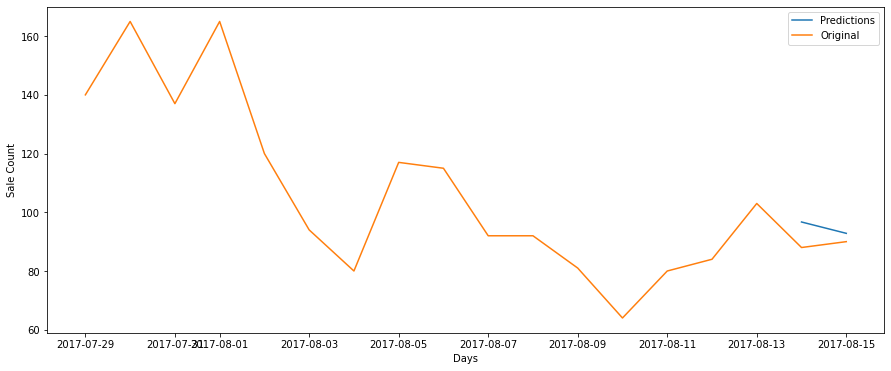

In [39]:
reg = LinearRegression().fit(x_train, y_train)
print(reg.coef_)
print(reg.intercept_)


ar_predictions = pd.Series(reg.predict(x_test), index=x_test.index)

plt.figure(figsize=(15,6))
plt.plot(ar_predictions ,label = "Predictions")
plt.plot(pd.concat([y_train, y_test], axis = 0)[-shown_train_size:], label = "Original" )
plt.xlabel("Days")
plt.ylabel("Sale Count")

print("mean_squared_error",mean_squared_error(y_test, ar_predictions))
print("mean_absolute_error",mean_absolute_error(y_test, ar_predictions))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(y_test, ar_predictions))


plt.legend(loc="upper right")

The quality of this model is slightly better than the previous one, if we build a forecast for 6 days ahead, we will see that this model predicts the trend quite well, since the silhouettes of the charts are similar.

#### Define p and q.

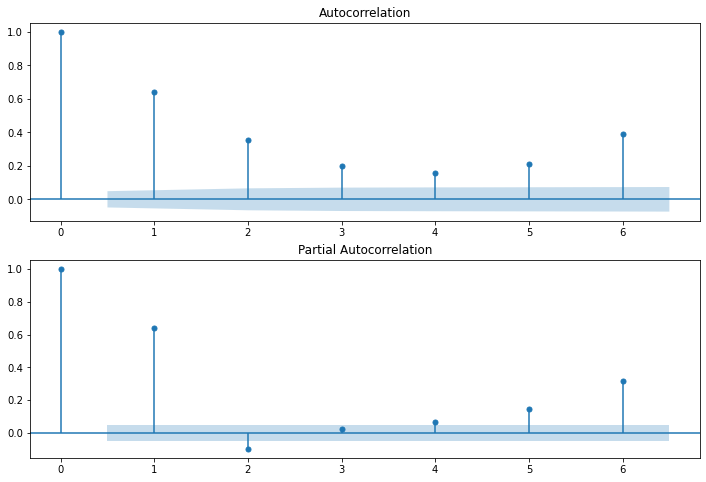

In [40]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(unit_sales_by_date.values.squeeze(), lags=6, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(unit_sales_by_date, lags=6, ax=ax2)

After examining the PACF correlogram, we can conclude that p = 6 and q = 6

### ARIMA model

In [41]:
model = ARIMA(y_train.values.reshape(-1), order=(6,0,6))

/Users/anna.zemit/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:965: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/Users/anna.zemit/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:977: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/Users/anna.zemit/opt/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



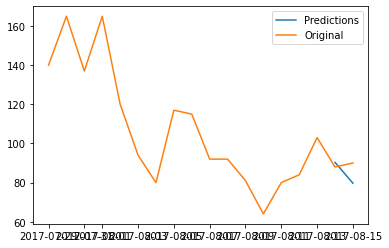

In [42]:
train_size = len(y_train)
test_size = predict_size
arima_predictions = model.fit().predict(start=train_size,end=train_size+test_size -1,  dynamic=False)

plt.plot(pd.Series(arima_predictions, index=y_test.index) ,label = "Predictions")
plt.plot(pd.concat([y_train, y_test], axis = 0)[-shown_train_size:], label = "Original" )
plt.legend(loc="upper right")

In [43]:
print("mean_squared_error",mean_squared_error(y_test, arima_predictions))
print("mean_absolute_error",mean_absolute_error(y_test, arima_predictions))
print("mean_absolute_percentage_error",mean_absolute_percentage_error(y_test, arima_predictions))

mean_squared_error 55.884444059334626
mean_absolute_error 6.331619051006044
mean_absolute_percentage_error 7.064896434120955


In this example, the linear regression prediction performed better than the ARIMA model. However, if you make a longer-term forecast (for example, for 6 days), then the quality of the ARIMA model is comparable to linear regression

# FPProphet

In [44]:
transactions = train.groupby('date')['unit_sales'].sum()
py.iplot([go.Scatter( 
    x=transactions.index,
    y=transactions
)])

*The influence of seasonality and holidays on the total volume of transaction purchases is clearly visible on the graph.*

In [45]:
# Make a prediction (prophet) for one year ahead

transactions = pd.DataFrame(transactions).reset_index()
transactions.columns = ['ds', 'y']
transactions

,ds,y
0,2013-01-01,2511.619
1,2013-01-02,496092.418
2,2013-01-03,361429.231
3,2013-01-04,354459.677
4,2013-01-05,477350.121
...,...,...
1679,2017-08-11,826373.722
1680,2017-08-12,792630.535
1681,2017-08-13,865639.677
1682,2017-08-14,760922.406


In [46]:
m = Prophet()
m.fit(transactions)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
forecast

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,332532.235774,235076.512477,5.111382e+05,332532.235774,3.325322e+05,43643.315403,43643.315403,43643.315403,-68157.126458,-68157.126458,-68157.126458,111800.441861,111800.441861,111800.441861,0.0,0.0,0.0,3.761756e+05
1,2013-01-02,332914.655872,240808.127261,5.224072e+05,332914.655872,3.329147e+05,55699.229560,55699.229560,55699.229560,-44192.011084,-44192.011084,-44192.011084,99891.240644,99891.240644,99891.240644,0.0,0.0,0.0,3.886139e+05
2,2013-01-03,333297.075970,144357.995062,4.310528e+05,333297.075970,3.332971e+05,-43913.493249,-43913.493249,-43913.493249,-131875.725243,-131875.725243,-131875.725243,87962.231995,87962.231995,87962.231995,0.0,0.0,0.0,2.893836e+05
3,2013-01-04,333679.496067,209510.964574,4.859789e+05,333679.496067,3.336795e+05,19156.515524,19156.515524,19156.515524,-57034.986552,-57034.986552,-57034.986552,76191.502075,76191.502075,76191.502075,0.0,0.0,0.0,3.528360e+05
4,2013-01-05,334061.916165,391470.897779,6.720652e+05,334061.916165,3.340619e+05,198748.733085,198748.733085,198748.733085,134001.693038,134001.693038,134001.693038,64747.040047,64747.040047,64747.040047,0.0,0.0,0.0,5.328106e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2044,2018-08-11,993261.871870,906846.519781,1.205968e+06,948777.919422,1.044856e+06,62722.380615,62722.380615,62722.380615,134001.693038,134001.693038,134001.693038,-71279.312422,-71279.312422,-71279.312422,0.0,0.0,0.0,1.055984e+06
2045,2018-08-12,993530.117995,970814.528990,1.251387e+06,948927.068857,1.045546e+06,116641.222512,116641.222512,116641.222512,188401.602282,188401.602282,188401.602282,-71760.379770,-71760.379770,-71760.379770,0.0,0.0,0.0,1.110171e+06
2046,2018-08-13,993798.364121,755563.828749,1.055350e+06,949076.218293,1.046172e+06,-92723.628282,-92723.628282,-92723.628282,-21143.445983,-21143.445983,-21143.445983,-71580.182299,-71580.182299,-71580.182299,0.0,0.0,0.0,9.010747e+05
2047,2018-08-14,994066.610246,716537.847467,1.003092e+06,949294.343968,1.046631e+06,-138897.641544,-138897.641544,-138897.641544,-68157.126458,-68157.126458,-68157.126458,-70740.515086,-70740.515086,-70740.515086,0.0,0.0,0.0,8.551690e+05


In [47]:
# Display on the chart
py.iplot([
    go.Scatter(x=transactions['ds'], y=transactions['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

In [48]:
# Colculate RSME
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-transactions['y'])**2)) )

RMSE: 108178.228128


In [49]:
# experiment with the changepoint_prior_scale coefficient

# changepoint_prior_scale=2.5
m = Prophet(changepoint_prior_scale=2.5)
m.fit(transactions)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [50]:
# calculate the root mean square error
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-transactions['y'])**2)) )
py.iplot([
    go.Scatter(x=transactions['ds'], y=transactions['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

RMSE: 97513.909836


In [51]:
# changepoint_prior_scale=1
m = Prophet(changepoint_prior_scale=1)
m.fit(transactions)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [52]:
# calculate the root mean square error
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-transactions['y'])**2)) )
py.iplot([
    go.Scatter(x=transactions['ds'], y=transactions['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

RMSE: 97801.491533


In [53]:
# changepoint_prior_scale=0.025
m = Prophet(changepoint_prior_scale=0.025)
m.fit(transactions)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [54]:
# calculate the root mean square error
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-transactions['y'])**2)) )
py.iplot([
    go.Scatter(x=transactions['ds'], y=transactions['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

RMSE: 110636.040279


In [55]:
# changepoint_prior_scale=0.01
m = Prophet(changepoint_prior_scale=0.01)
m.fit(transactions)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [56]:
# calculate the root mean square error
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-transactions['y'])**2)) )
py.iplot([
    go.Scatter(x=transactions['ds'], y=transactions['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

RMSE: 110873.051834


As you can see in the charts above, the forecast is quite good and consistent with the ups and downs of the data. As the changepoint_prior_scale coefficient increases, the trend becomes more flexible, and the standard error decreases, but the probability of trend overfitting increases.

In [57]:
# add monthly seasonality to the model
m = Prophet(changepoint_prior_scale=2.5)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(transactions)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [58]:
# calculate the root mean square error
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-transactions['y'])**2)) )
py.iplot([
    go.Scatter(x=transactions['ds'], y=transactions['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

RMSE: 90949.424537


As you can see in the graph, after adding seasonality, the rms error decreased significantly, and the quality of model prediction improved slightly.

In [59]:
# add holidays to the model
df_holidays_events = pd.read_csv('holidays_events.csv')

In [60]:
holidays = df_holidays_events[df_holidays_events['transferred'] == False][['description', 'date']]
holidays.columns = ['holiday', 'ds']
holidays

,holiday,ds
0,Fundacion de Manta,2012-03-02
1,Provincializacion de Cotopaxi,2012-04-01
2,Fundacion de Cuenca,2012-04-12
3,Cantonizacion de Libertad,2012-04-14
4,Cantonizacion de Riobamba,2012-04-21
...,...,...
345,Navidad-3,2017-12-22
346,Navidad-2,2017-12-23
347,Navidad-1,2017-12-24
348,Navidad,2017-12-25


In [61]:
m = Prophet(changepoint_prior_scale=2.5, holidays=holidays)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(transactions)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [62]:
# calculate the root mean square error
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-transactions['y'])**2)) )
py.iplot([
    go.Scatter(x=transactions['ds'], y=transactions['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

RMSE: 74192.409921


The model predicted surges for the New Year period. However, it failed to catch the sharp down move on January 1st, 2017, but did a good job of predicting sales on December 24th. And also the forecast period after August 2017 looks good.

# Training regression models for time series

In [63]:
# Data
transactions = transactions.set_index(pd.DatetimeIndex(transactions['ds']))
transactions.drop(['ds'], axis = 1, inplace = True)
transactions.head()

,y
ds,
2013-01-01,2511.619
2013-01-02,496092.418
2013-01-03,361429.231
2013-01-04,354459.677
2013-01-05,477350.121


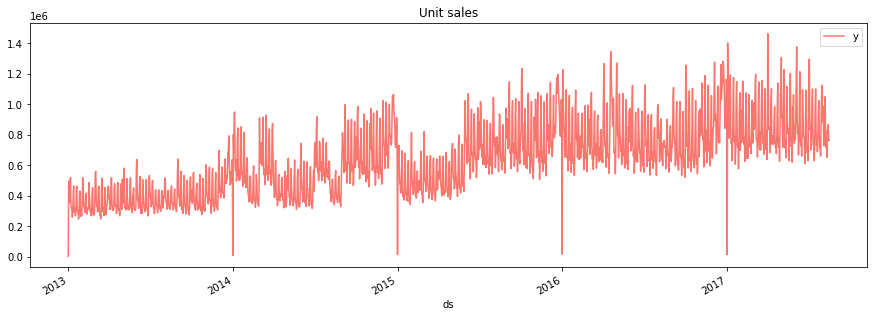

In [64]:
color_pal = ["#F8766D", "#D39200", "#93AA00", "#00BA38", "#00C19F", "#00B9E3", "#619CFF", "#DB72FB"]
_ = transactions.plot(style='-', figsize=(15,5), color=color_pal[0], title='Unit sales')

In [65]:
# Train / Test Split
# Cut off data after 2016-06-01 to use as a validation set
split_date = '2016-06-01'
trns_train = transactions.loc[transactions.index <= split_date].copy()
trns_test = transactions.loc[transactions.index > split_date].copy()

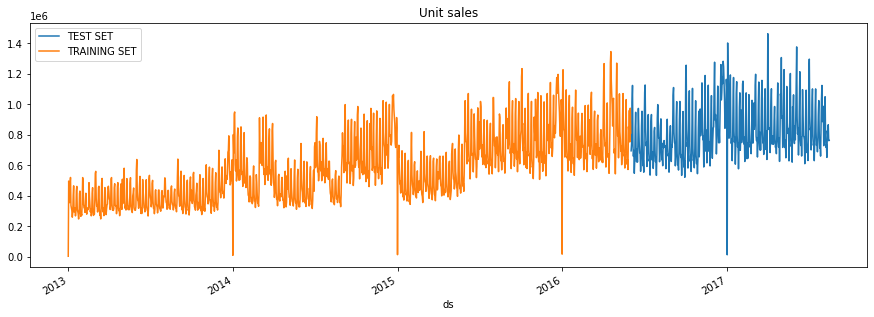

In [66]:
_ = trns_test \
    .rename(columns={'y': 'TEST SET'}) \
    .join(trns_train.rename(columns={'y': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Unit sales', style='-')

In [67]:
# Create time tags from datetime

def create_features(df, label=None):
    
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

In [68]:
X_train, y_train = create_features(trns_train, label='y')
X_test, y_test = create_features(trns_test, label='y')

<ipython-input-67-91d8fdc2f1ce>:15: FutureWarning:

Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.



### XGBoost

In [69]:
reg = xgb.XGBRegressor(n_estimators=1000)
# Train XGBoost
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

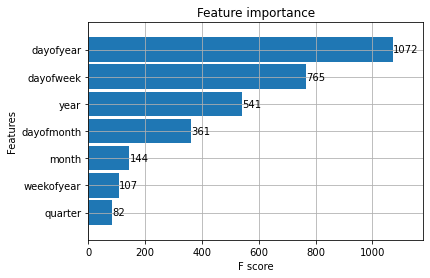

In [70]:
# Evaluate the importance of features
_ = plot_importance(reg, height=0.9)

We see that the day of the year was used most often to separate the trees, followed by the day of the week and the year. The quarter is of low importance due to the fact that it could be created by different division into days and years.

In [71]:
# make a prediction and display the result on the chart
trns_test['Prediction'] = reg.predict(X_test)
trns_all = pd.concat([trns_test, trns_train], sort=False)

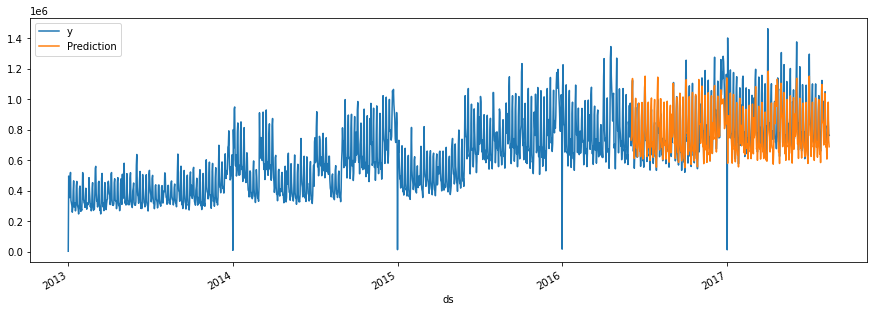

In [72]:
_ = trns_all[['y','Prediction']].plot(figsize=(15, 5))

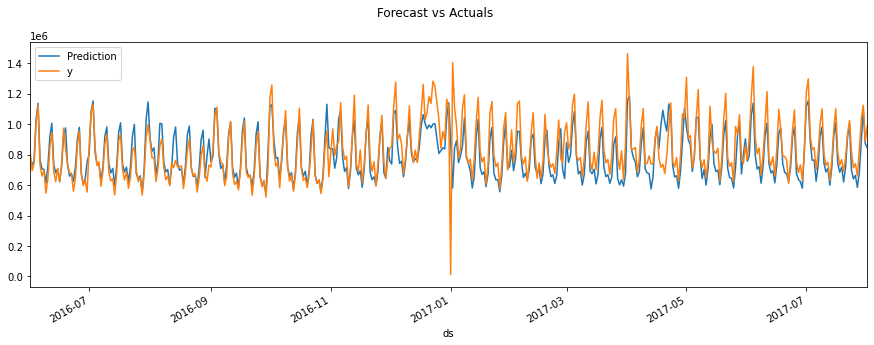

In [73]:
# Compare the result with the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = trns_all[['Prediction','y']].plot(ax=ax,
                                              style=['-','-'])
ax.set_xbound(lower='2016-06-01', upper='2017-08-01')
plot = plt.suptitle('Forecast vs Actuals')

In [74]:
# Errors on Test Set

# MSE
mean_squared_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction'])

12685556375.029734

In [75]:
# MAE
mean_absolute_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction'])

78236.13721981765

In [76]:
# MAPE
mean_absolute_percentage_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction'])

25.28905996646421

### Compare with CatBoost

In [77]:
cbr = CatBoostRegressor(n_estimators=1000)
cbr.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

In [78]:
trns_test['Prediction_catboost'] = cbr.predict(X_test)
trns_all = pd.concat([trns_test, trns_train], sort=False)

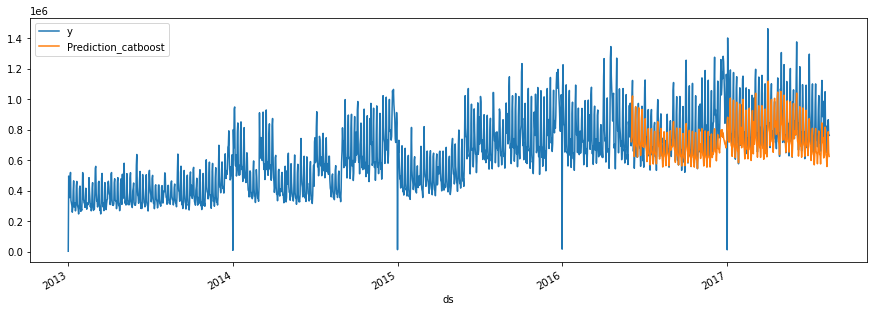

In [79]:
_ = trns_all[['y','Prediction_catboost']].plot(figsize=(15, 5))

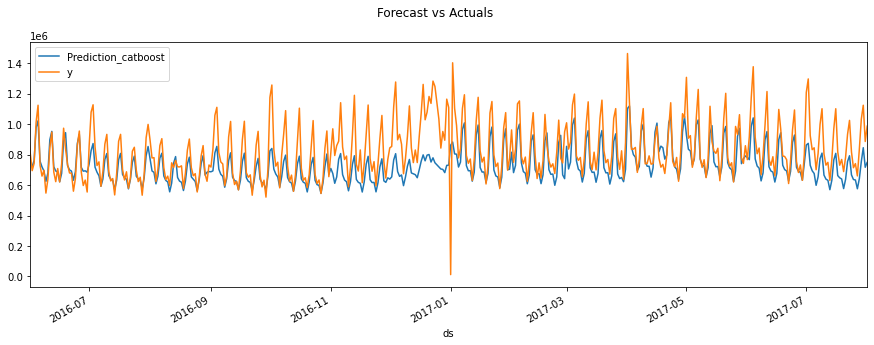

In [80]:
# Compare the result with the forecast
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = trns_all[['Prediction_catboost','y']].plot(ax=ax,
                                              style=['-','-'])
ax.set_xbound(lower='2016-06-01', upper='2017-08-01')
plot = plt.suptitle('Forecast vs Actuals')

In [81]:
# Errors on Test Set

# MSE
mean_squared_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction_catboost'])

23339882717.497116

In [82]:
# MAE
mean_absolute_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction_catboost'])

112089.2238418027

In [83]:
# MAPE
mean_absolute_percentage_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction_catboost'])

28.118764028819427

So far, the XGboost model has performed significantly better than catboost. The MAE, MAPE, MSE metrics of the XGboost model are much better. But to further improve the metrics, additional tuning of the models and adding features is required.

# Add holidays

In [84]:
holidays = holidays.set_index(pd.DatetimeIndex(holidays['ds'])) 
holidays.drop(['ds'], axis = 1, inplace = True)
holidays.head()

,holiday
ds,
2012-03-02,Fundacion de Manta
2012-04-01,Provincializacion de Cotopaxi
2012-04-12,Fundacion de Cuenca
2012-04-14,Cantonizacion de Libertad
2012-04-21,Cantonizacion de Riobamba


In [85]:
def fill_holiday(x):
    if x in holidays.index:
        return 1
    else:
        return 0

In [86]:
X_train['holiday'] = X_train.index
X_train['holiday'] = X_train['holiday'].apply(fill_holiday)

<ipython-input-86-2db7d74b9048>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-86-2db7d74b9048>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [87]:
X_test['holiday'] = X_test.index
X_test['holiday'] = X_test['holiday'].apply(fill_holiday)

<ipython-input-87-7d32771289a4>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-87-7d32771289a4>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### Train XGBoost

In [88]:
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [89]:
# Make a Prediction
trns_test['Prediction'] = reg.predict(X_test)

In [90]:
# Errors on Test Set

# MSE
mean_squared_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction'])

11839682440.395138

In [91]:
# MAE
mean_absolute_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction'])

77567.80040034151

In [92]:
# MAPE
mean_absolute_percentage_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction'])

25.322267569086378

### Compare with CatBoost

In [93]:
cbr.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

In [94]:
trns_test['Prediction_catboost'] = cbr.predict(X_test)

In [95]:
# Errors Test Set

# MSE
mean_squared_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction_catboost'])

20275831453.072746

In [96]:
# MAE
mean_absolute_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction_catboost'])

101334.46433488582

In [97]:
# MAPE
mean_absolute_percentage_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction_catboost'])

29.455377940063215

After adding holiday data, the MSE and MAE metrics improved for both models, but the MAPE score dropped slightly for both the XGboost and CatBoost models

# Add lags

In [98]:
# Get the lag factors from the 7th to the 12th previous day

df_test = pd.DataFrame()

df_test["Original Values"]  = y_test
df_test["shift7"] = df_test["Original Values"].shift(7)
df_test["shift8"] = df_test["shift7"].shift()
df_test["shift9"] = df_test["shift8"].shift()
df_test["shift10"] = df_test["shift9"].shift()
df_test["shift11"] = df_test["shift10"].shift()
df_test["shift12"] = df_test["shift11"].shift()
df_test["shift13"] = df_test["shift12"].shift()
df_test.dropna(inplace=True)

In [99]:
df_test.drop(['Original Values'], axis = 1, inplace = True)
df_test.head()

,shift7,shift8,shift9,shift10,shift11,shift12,shift13
ds,,,,,,,
2016-06-15,696747.550,658714.653,729894.223,1123734.436,1011996.616,742363.085,694535.936
2016-06-16,547139.613,696747.550,658714.653,729894.223,1123734.436,1011996.616,742363.085
2016-06-17,637354.320,547139.613,696747.550,658714.653,729894.223,1123734.436,1011996.616
2016-06-18,845838.206,637354.320,547139.613,696747.550,658714.653,729894.223,1123734.436
2016-06-19,947479.765,845838.206,637354.320,547139.613,696747.550,658714.653,729894.223


In [100]:
X_test = X_test.merge(df_test, left_index=True, right_index=True, how='left')
X_test.head()

,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,holiday,shift7,shift8,shift9,shift10,shift11,shift12,shift13
ds,,,,,,,,,,,,,,,,
2016-06-02,0,3,2,6,2016,154,2,22,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-06-03,0,4,2,6,2016,155,3,22,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-06-04,0,5,2,6,2016,156,4,22,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-06-05,0,6,2,6,2016,157,5,22,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-06-06,0,0,2,6,2016,158,6,23,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [101]:
df_train = pd.DataFrame()

df_train["Original Values"]  = y_train
df_train["shift7"] = df_train["Original Values"].shift(7)
df_train["shift8"] = df_train["shift7"].shift()
df_train["shift9"] = df_train["shift8"].shift()
df_train["shift10"] = df_train["shift9"].shift()
df_train["shift11"] = df_train["shift10"].shift()
df_train["shift12"] = df_train["shift11"].shift()
df_train["shift13"] = df_train["shift12"].shift()
df_train.dropna(inplace=True)
df_train.drop(['Original Values'], axis = 1, inplace = True)
df_train.head()

,shift7,shift8,shift9,shift10,shift11,shift12,shift13
ds,,,,,,,
2013-01-14,336122.801,519695.401,477350.121,354459.677,361429.231,496092.418,2511.619
2013-01-15,318347.778,336122.801,519695.401,477350.121,354459.677,361429.231,496092.418
2013-01-16,302530.809,318347.778,336122.801,519695.401,477350.121,354459.677,361429.231
2013-01-17,258982.003,302530.809,318347.778,336122.801,519695.401,477350.121,354459.677
2013-01-18,289737.685,258982.003,302530.809,318347.778,336122.801,519695.401,477350.121


In [102]:
X_train = X_train.merge(df_train, left_index=True, right_index=True, how='left')
X_train.head()

,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,holiday,shift7,shift8,shift9,shift10,shift11,shift12,shift13
ds,,,,,,,,,,,,,,,,
2013-01-01,0,1,1,1,2013,1,1,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-02,0,2,1,1,2013,2,2,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-03,0,3,1,1,2013,3,3,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-04,0,4,1,1,2013,4,4,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-01-05,0,5,1,1,2013,5,5,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Train XGBoost

In [103]:
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.300000012, max_delta_step=0, max_depth=6,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=1000, n_jobs=0, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [104]:
# Make a prediction
trns_test['Prediction'] = reg.predict(X_test)

In [105]:
# Errors Test Set

# MSE
mean_squared_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction'])

14649896375.628834

In [106]:
# MAE
mean_absolute_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction'])

84334.012436788

In [107]:
# MAPE
mean_absolute_percentage_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction'])

19.805986836644717

### Compare with CatBoost

In [108]:
cbr.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

In [109]:
trns_test['Prediction_catboost'] = cbr.predict(X_test)

In [110]:
# Errors Test Set

# MSE
mean_squared_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction_catboost'])

14466814191.465963

In [111]:
# MAE
mean_absolute_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction_catboost'])

76981.59102013084

In [112]:
# MAPE
mean_absolute_percentage_error(y_true=trns_test['y'],
                   y_pred=trns_test['Prediction_catboost'])

26.044948429190796

# Conclusion

After conducting the experiments, the following conclusions were made:
- On the given data, the XGboost model performs better than Catboost in terms of all metrics (MSE, MAE, MAPE).
- Adding holiday data improved the MAE and MSE metrics for both models, although the MAPE metric slightly decreased.
- Adding lags noticeably decreased the prediction quality of the XGboost model (lower MSE and MAE values), but it improved the performance of the Catboost model across all metrics (MSE, MAE, MAPE).
- After adding lags, both models showed an improvement in the MAPE metric.